<a href="https://colab.research.google.com/github/divilian/frozone/blob/main/Bias_and_Intent_Notebook.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Introduction**

**Authors**

Garrett McKenzie

Laur Rider

Stephen Davies

This notebook is intended as a demonstration of potential approaches to the problem of detecting bias, intent of the author, and polarization in a text. The work in this notebook is part of the larger "Project Frozone" which is a research project being conducted at the University Of Mary Washington.


Again, please be aware that the code in this notebook is for demonstration/testing purposes only and likely contains inefficiencies, bugs, and other issues. It is not object oriented and is entirely written with the goal of functionality and not larger integration.

Below is a simple flow chart for the larger intended FroBot application. Note that this notebook is testing for a single flow of the bot.

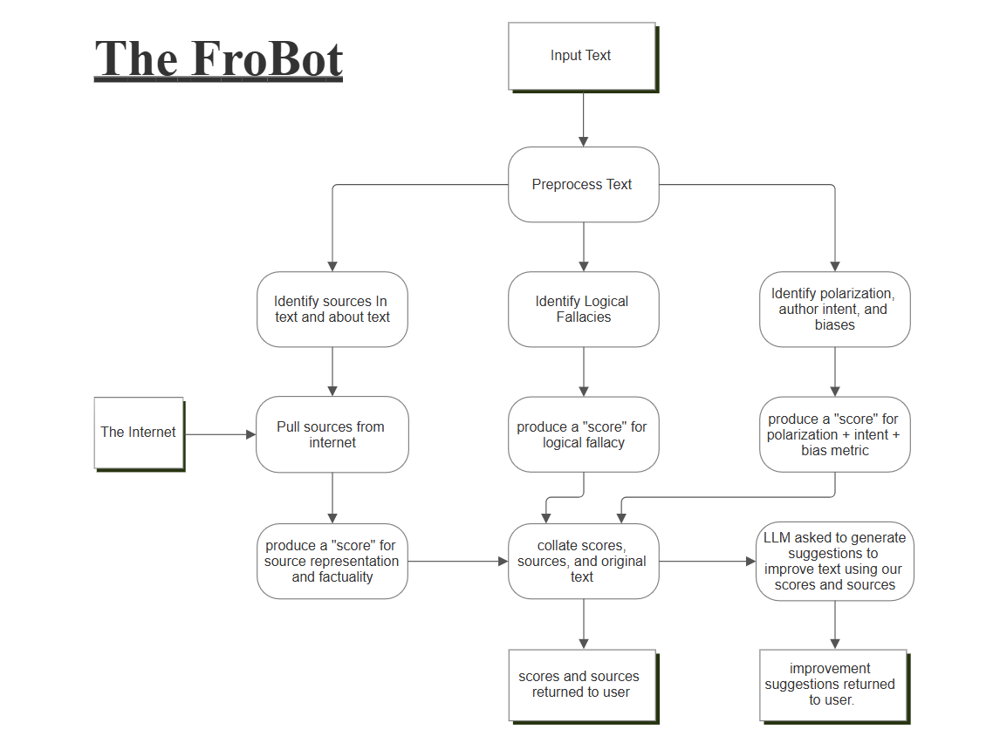

**Table Of Contents**

1) Introduction

2) Dependencies, Data, and Models

3) Measurment and Detection of Bias

4) Measurment and Detection of Authors Intent

5) Measurment and Detection of Polarization

6) Combining Into A Single Metric

7) Exploration of Word Embeddings

8) Sources

# **Dependencies and Data**

In [1]:
#I use this to get the stuff into collab because the embeddings collection is a 4 GB file and it took forever to upload
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [2]:
#Package Dependencies
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import torch
import torch.nn as nn
import numpy as np
import keras
import tensorflow as tf
from datasets import load_dataset
import plotly.express as px

In [3]:
np.random.seed(42)

The data used for the author intent section is from HuggingFace and is linked below:

https://huggingface.co/datasets/sugiv/synthetic-text-transformation-dataset/tree/main/data

In [4]:
AuthorIntentData = pd.read_parquet("/content/drive/MyDrive/Fall 2025 - Spring 2026 Research/train-00000-of-00001.parquet")
AuthorIntentData.head(5)

,task,input_text,output_text,Tone,Target Audience,Verbosity,Style,Complexity Level,Emotion,Purpose,Vocabulary Range
0,paraphrasing,"""Hey guys, make sure you all do your homework ...","""Dear students, please ensure that you complet...",Professional,Teenagers,Balanced,Descriptive,Intermediate,Neutral,Instruct,Basic
1,paraphrasing,"So, like, you know, when you're, um, using tha...","When using your computer, remember to click th...",Casual,Senior citizens,Concise,Narrative,Intermediate,Cautious,Instruct,Technical
2,paraphrasing,""" As we grow older , we must remember that age...","""In the grand tapestry of life, as the years g...",Inspirational,Senior citizens,Elaborate,Descriptive,Advanced,Enthusiastic,Instruct,Advanced
3,paraphrasing,"""Dude, like, homework is so lame. We should to...","""Homework is totally overrated. Let's scrap it...",Casual,Teenagers,Concise,Argumentative,Intermediate,Enthusiastic,Instruct,Creative
4,paraphrasing,The study of quantum mechanics has shown that ...,Quantum mechanics elucidates the capability of...,Formal,Academic researchers,Concise,Argumentative,Intermediate,Neutral,Inform,Technical


The data used for the polarization detection section is from project polarops and can be found in a file in the frozone repo.

https://github.com/divilian/frozone/tree/main/data/polarops

In [5]:
PolarizationData = pd.read_csv("/content/drive/MyDrive/Fall 2025 - Spring 2026 Research/polarops.csv",comment="#")
PolarizationData.head(5)

,comment_id,polarized,text
0,h15poei,False,>I honestly don't have an issue with this. We...
1,h15fsuz,False,>This is like a couple dozen dollars per priso...
2,h159h8b,False,>Federal prison inmates do have a unique looph...
3,h13bl5i,False,>What is it with these blue states in New Engl...
4,h13105s,False,>Posting this because Charlie Baker is an inte...


The data used for exploring word embeddings is from the NLPL Word Vectors Repository. The model itself is word2vec

http://vectors.nlpl.eu/repository/

https://code.google.com/archive/p/word2vec/

In [6]:
colNames = ["Token"]
for value in range(100):
  colNames.append(str(value))

EmbeddingData = pd.read_csv("/content/drive/MyDrive/Fall 2025 - Spring 2026 Research/model.txt",skiprows=[0],header=None,index_col=False,names=colNames, sep=" ", encoding = "latin-1")
EmbeddingData.head(5)

,Token,0,1,2,3,4,5,6,7,8,...,90,91,92,93,94,95,96,97,98,99
0,</s>,0.004003,0.004419,-0.003830,-0.003278,0.001367,0.003021,0.000941,0.000211,-0.003604,...,-0.001532,-0.002107,-0.002907,0.002815,0.001579,0.000425,-0.002194,0.001524,0.003059,0.000194
1,",",0.068465,-0.123285,0.269268,-0.153580,0.295522,0.032128,0.134400,-0.229235,-0.401954,...,-0.072238,0.310949,-0.205118,-0.023065,0.072462,0.176645,0.146214,-0.092054,0.108556,-0.201675
2,the,-0.145301,-0.150899,0.389752,0.019979,0.209313,-0.059876,-0.037605,-0.191378,-0.492421,...,0.076898,0.172123,-0.248498,0.042334,0.053334,0.048210,0.239207,-0.083211,0.214255,-0.118595
3,.,0.115446,-0.135395,0.188071,-0.037970,0.371267,0.237732,-0.039366,-0.385034,-0.327795,...,0.111329,0.338978,-0.300061,-0.108043,0.123992,-0.028241,0.169494,-0.184823,0.097311,-0.159740
4,of,0.006836,-0.270947,0.313386,0.002629,0.166432,0.137461,0.024032,-0.287647,-0.308097,...,0.030654,0.218632,-0.332241,0.076311,0.173629,-0.011477,0.118304,-0.246484,0.343904,-0.384060


# **Exploration of Word Embeddings**

Here, the exploration of the word embeddings starts with testing a few diffrent methods of PCA and clustering. Then, the best identified process is used on the whole of the word embeddings to produce clusters of similar semantic meaning.

In [7]:
#tools of the trade
from sklearn.decomposition import PCA
from sklearn.cluster import DBSCAN
from sklearn.cluster import Birch
from sklearn.mixture import GaussianMixture
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
from sklearn.neighbors import NearestNeighbors
from sklearn.metrics import calinski_harabasz_score

In [8]:
pca = PCA(n_components=3)

In [9]:
reducedData = pca.fit_transform(EmbeddingData[[str(value) for value in range(100)]])

In [10]:
reducedData = pd.DataFrame(reducedData,columns=["x","y","z"])
reducedData["Token"] = EmbeddingData["Token"]
sampleData = reducedData.sample(n = 40000)

In [11]:
px.scatter_3d(sampleData , x = 'x' , y = 'y' , z = 'z')

In only a 3D space, the word embeddings seem very densly clustered. This is both a good and bad thing. It is good because the higher dimensional space the normal word embeddings are in is too sparse for many clustering algorithms, so being able to effectively reduce sparsity is going to help us. It is bad because this is probably too dense for an algorithm to get out meaningful clusters.

Lets try DBSCAN on it anyways and see what we get.

In [12]:
#step one is to estimate an optimal eps using the kNN method

#get distances to 6 nearest neighbors
k = 6
Knbrs = NearestNeighbors(n_neighbors=k + 1)
Knbrs.fit(sampleData[["x","y",'z']])
dist,indx = Knbrs.kneighbors(sampleData[["x","y",'z']])

#remove first element which is the point iteself and take average of each
sortedDist = np.zeros((dist.shape[0]))
for i in range(len(dist)):
  sortedDist[i] += dist[i][1:].mean()
sortedDist = np.sort(sortedDist)

#graph it my guy
px.line(sortedDist,title="Looks like 0.15 ish is optimal eps")

In [13]:
clusterIt = DBSCAN(eps=0.15 , min_samples = 6)
clustered = clusterIt.fit_predict(sampleData[["x","y","z"]].to_numpy())

In [14]:
#note that sckit-learns DBSCAN algorithm uses -1 to identify outliers
sampleData["clusterDBSCAN"] = clustered.astype(str)
px.bar(sampleData["clusterDBSCAN"].value_counts())

In [15]:
px.scatter_3d(sampleData, x = 'x' , y = 'y' , z = 'z',color = 'clusterDBSCAN')

In [16]:
px.scatter_3d(sampleData[(sampleData["clusterDBSCAN"] != "-1") & (sampleData["clusterDBSCAN"] != "0") ] , x = 'x' , y = 'y' , z = 'z',color = 'clusterDBSCAN')

In [17]:
print("Silhouette Score:")
print(silhouette_score(sampleData[["x","y","z"]] , sampleData["clusterDBSCAN"]))
print("Calinski Harabasz Score")
print(calinski_harabasz_score(sampleData[["x","y","z"]] , sampleData["clusterDBSCAN"]))

Silhouette Score:
-0.04233020500497643
Calinski Harabasz Score
85.85027101343508


Alright, DBSCAN worked meh. It would probably go alot better if we went with a higher dimensional space but for demonstration purposes this is good enough to talk about.

Im going to try BIRCH then use silhouette score with KMeans to try to find clusters.

In [18]:
birchCluster = Birch(threshold = 0.5 , n_clusters = None)
guess = birchCluster.fit_predict(sampleData[["x","y",'z']])

In [19]:
sampleData["clusterBIRCH"] = guess.astype(str)
px.bar(sampleData["clusterBIRCH"].value_counts())

In [20]:
px.scatter_3d(sampleData, x = 'x' , y = 'y' , z = 'z',color = 'clusterBIRCH')

In [21]:
print("Silhouette Score:")
print(silhouette_score(sampleData[["x","y","z"]] , sampleData["clusterBIRCH"]))
print("Calinski Harabasz Score")
print(calinski_harabasz_score(sampleData[["x","y","z"]] , sampleData["clusterBIRCH"]))

Silhouette Score:
0.19496554669870586
Calinski Harabasz Score
3479.979930646251


This LOOKS better than the DBSCAN method. Of course, the real question is if the clusters have any meaning and how we figure out those meanings in an unsupervised manner.

Lets try out K-means and figure out optimal number of clusters using Silhoutte score.

In [22]:
resultsSil = []
resultsCal = []
for i in range(2,32):
  KCluster = KMeans(n_clusters=i)
  predictions = KCluster.fit_predict(sampleData[["x","y",'z']])
  scoreSil = silhouette_score(sampleData[["x","y",'z']], predictions)
  scoreCal = calinski_harabasz_score(sampleData[["x","y","z"]] , predictions)
  resultsSil.append(scoreSil)
  resultsCal.append(scoreCal)

In [23]:
px.line(resultsSil,title="Sil")

In [24]:
px.line(resultsCal,title="Cal")

In [25]:
KCluster = KMeans(n_clusters = 3)
kguess = KCluster.fit_predict(sampleData[["x","y",'z']])

In [26]:
sampleData["clusterK"] = kguess.astype(str)
px.bar(sampleData["clusterK"].value_counts())

In [27]:
px.scatter_3d(sampleData, x = 'x' , y = 'y' , z = 'z',color = 'clusterK')

Okay so for now I'm going to stick with BIRCH mostly because I like the way it clustered the data in a three dimensional space and I think it will prove the best for demonstrating what im trying to do.

Obviously this is not a "data driven approach" to the problem but we can worry about that when we get to production code.

In [58]:
#this part is fine
pcaModel = PCA(n_components=10)
reducedData = pcaModel.fit_transform(EmbeddingData[[str(value) for value in range(100)]])

#jesus christ this shit took 30 minutes to complete please never run it again oh my god
'''

clusteringModel = Birch(threshold = 0.5 , n_clusters = None)
predictions = clusteringModel.fit_predict(reducedData)
clusters = np.array(predictions)
np.save("clustersFromBirchForEmbedding" , clusters)

'''
#so we skip it and just load in prior work
predictions = np.load("/content/drive/MyDrive/Fall 2025 - Spring 2026 Research/clustersFromBirchForEmbedding.npy")

In [59]:
reducedData = pd.DataFrame(reducedData, columns = [str(value) for value in range(len(reducedData[1]))])
reducedData["Cluster"] = predictions

In [82]:
#get average vector for the cluster then can we do something with this vector to determine the semantic meaning of the cluster
reducedData[reducedData["Cluster"] == 20280].mean()

,0
0,0.087468
1,0.669414
2,-0.283970
3,-0.420120
4,0.156578
5,0.090463
6,-0.120551
7,0.411410
8,0.291090
9,-0.391839


**What Was The Point Of That?**

Basically, I think the clusters of word embeddings provide a glimpse into a learned semantic meaning for subgroups of the vocabulary. If the clusters can be labled, then the tokens in a document can be placed in the clusters to determine their underlying semantic meaning. With this understanding, it could prove fairly easy to alert/detect on documents containing words that are associated with rasict, sexist, or otherwise biased semantic meanings. This could help inform users of words they use or read which they may not realize communicates a bias.

There is also this thing called a sentence embedding where you can throw a whole text and get out an embedding. We could do that, cluster the embeddings, and then propogate labels from sentences which are identified to be biased in a certain way, such as sexist or racist.

I don't know if either method is a novel approach to the problem of bias detection/quantification. I would imagine that it has been done before as it seems like a straightforward approach to the problem. However, if it hasn't then it could be a cool building block to add to the research along with the whole tool that is FroBot.